# DISCO PROJECT

In [1]:
#Importing Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from itertools import zip_longest
import networkx as nx

Enter dataset number from 1 to 200: 1
Outfile is downloaded as styled_dataset_1_1


,Courses,Professor1,Professor2
0,FDC1,Aiden,Isaac
1,FDC2,Kaden,None
2,FDC3,Delilah,Donald
3,FDC4,Gabriel,Zuri
4,FDC5,Yosef,None
5,FDC6,Tessa,Jasmine
6,FDC7,Fiona,Ethan
7,FDC8,Rose,None
8,FDC9,Yosef,Bella
9,FDC10,Nora,None


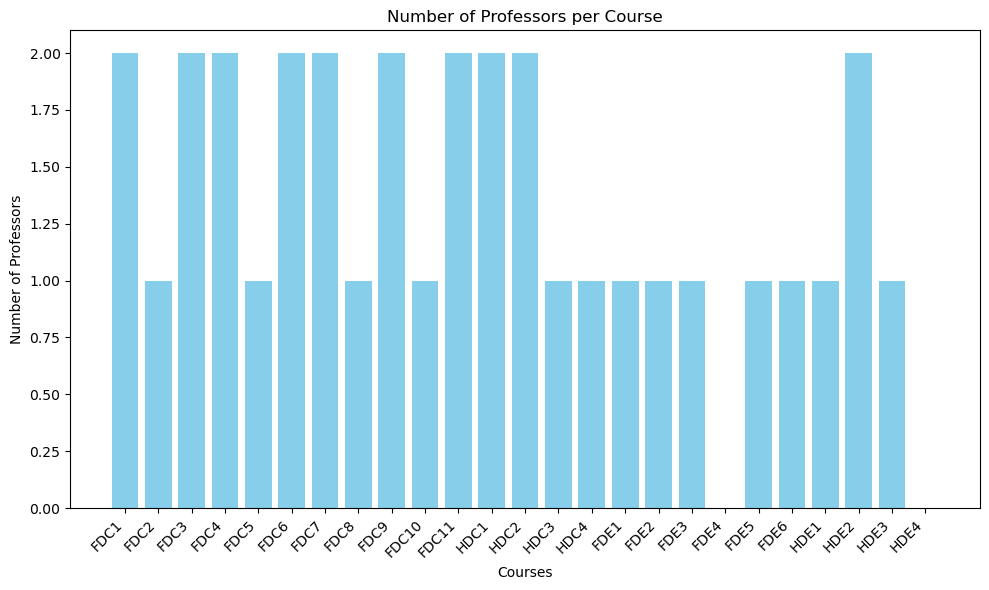

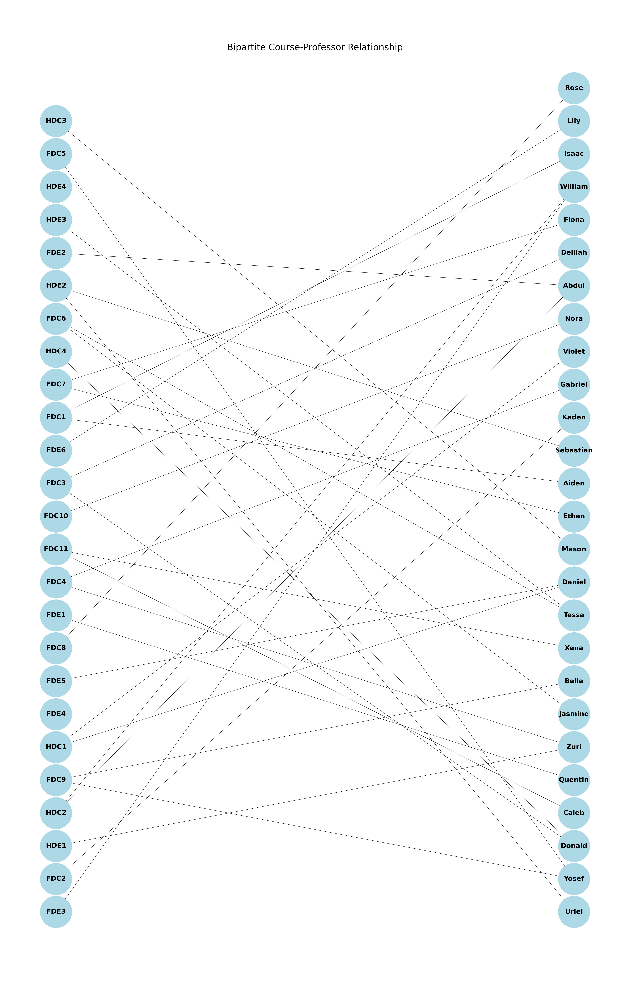

Outfile is downloaded as styled_dataset_1_2


,Courses,Professor1,Professor2
0,FDC1,Isaac,Aiden
1,FDC2,Kaden,None
2,FDC3,Delilah,Donald
3,FDC4,Gabriel,Zuri
4,FDC5,Yosef,None
5,FDC6,Tessa,Jasmine
6,FDC7,Fiona,Ethan
7,FDC8,Rose,None
8,FDC9,Bella,Yosef
9,FDC10,Nora,None


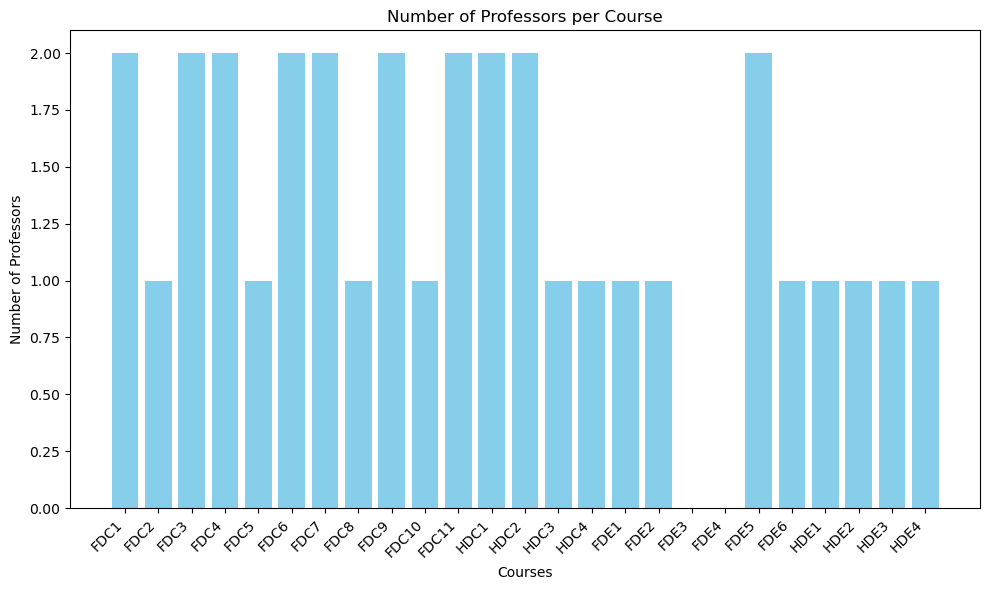

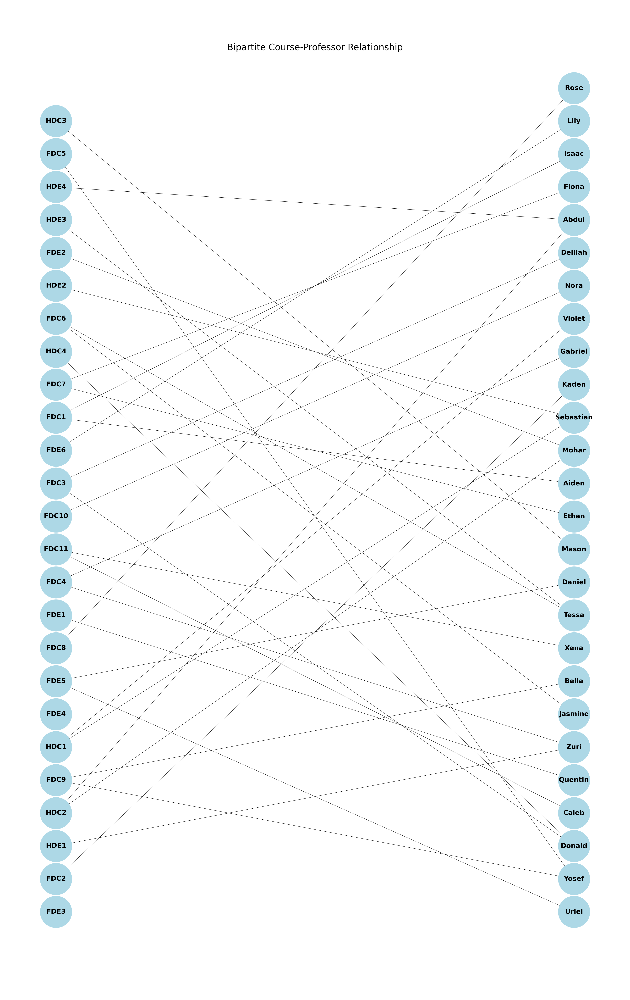

Outfile is downloaded as styled_dataset_1_3


,Courses,Professor1,Professor2
0,FDC1,Aiden,Isaac
1,FDC2,Kaden,None
2,FDC3,Delilah,Donald
3,FDC4,Gabriel,Zuri
4,FDC5,Yosef,None
5,FDC6,Tessa,Jasmine
6,FDC7,Fiona,Ethan
7,FDC8,Mason,None
8,FDC9,Bella,Yosef
9,FDC10,Nora,None


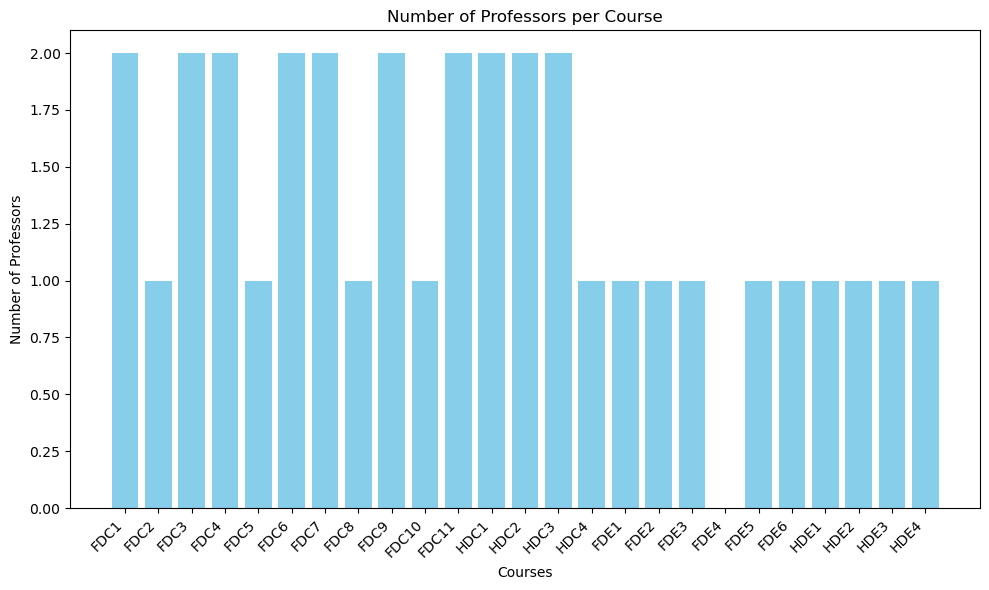

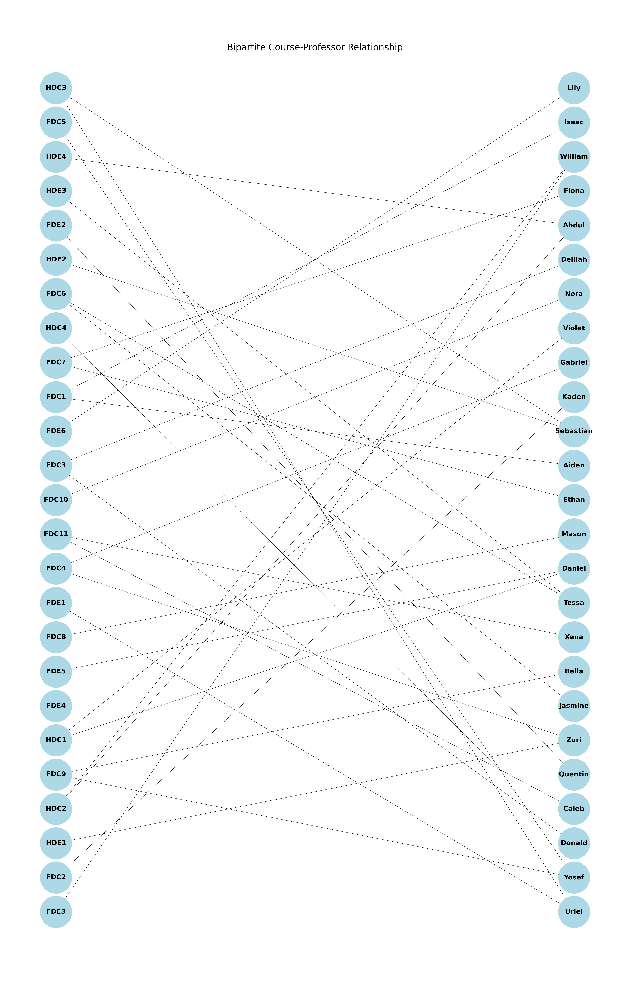

Outfile is downloaded as styled_dataset_1_4


,Courses,Professor1,Professor2
0,FDC1,Aiden,Isaac
1,FDC2,Uriel,Donald
2,FDC3,Delilah,Hannah
3,FDC4,Gabriel,Zuri
4,FDC5,Yosef,None
5,FDC6,Tessa,Jasmine
6,FDC7,Fiona,Ethan
7,FDC8,Mason,None
8,FDC9,Yosef,Bella
9,FDC10,Nora,None


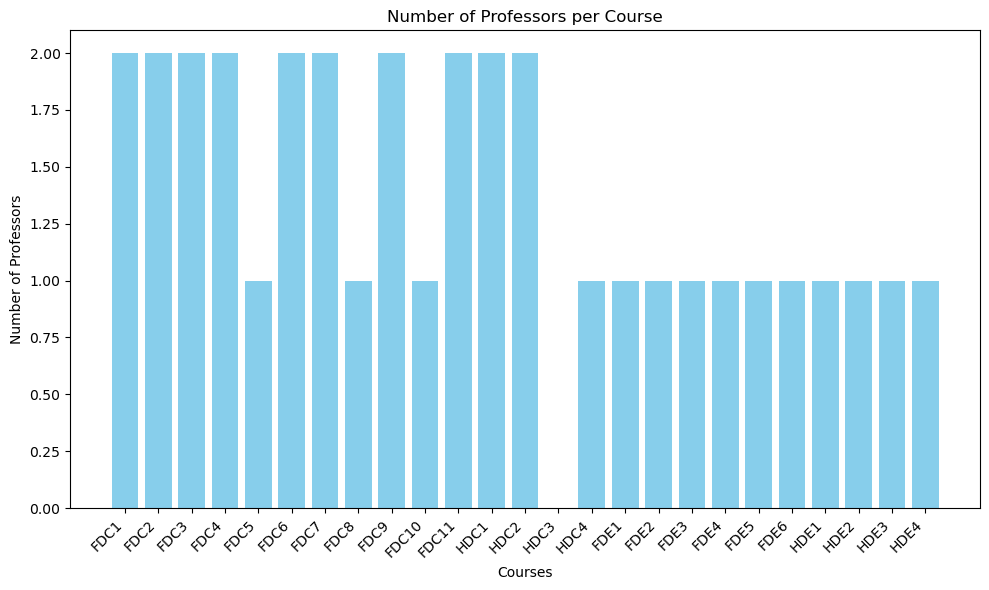

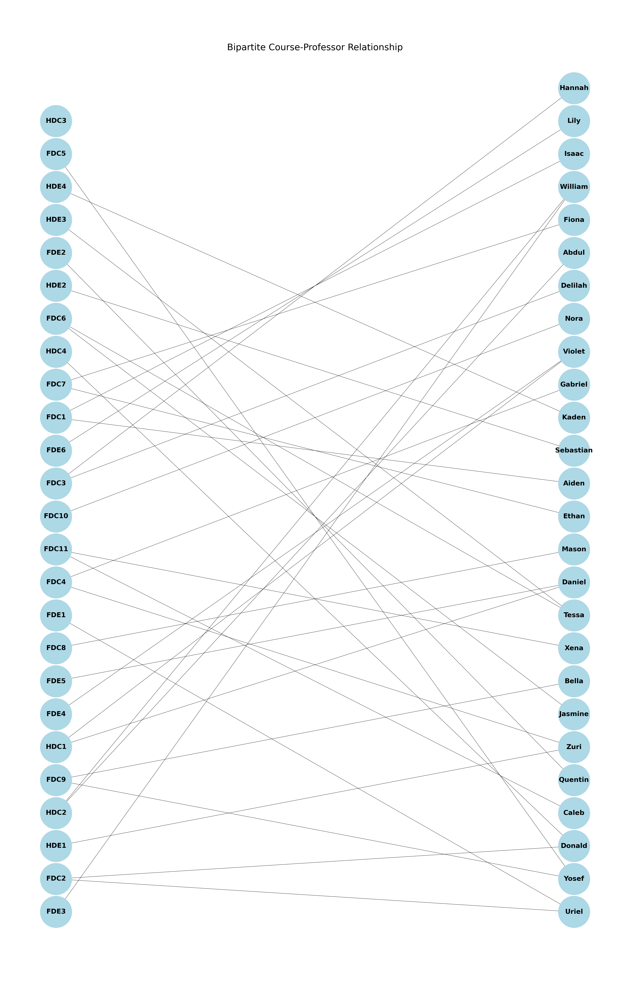

Outfile is downloaded as styled_dataset_1_5


,Courses,Professor1,Professor2
0,FDC1,Aiden,Isaac
1,FDC2,Donald,Uriel
2,FDC3,Delilah,Sebastian
3,FDC4,Gabriel,Zuri
4,FDC5,Yosef,None
5,FDC6,Tessa,Jasmine
6,FDC7,Fiona,Ethan
7,FDC8,Violet,Hannah
8,FDC9,Yosef,Bella
9,FDC10,Nora,None


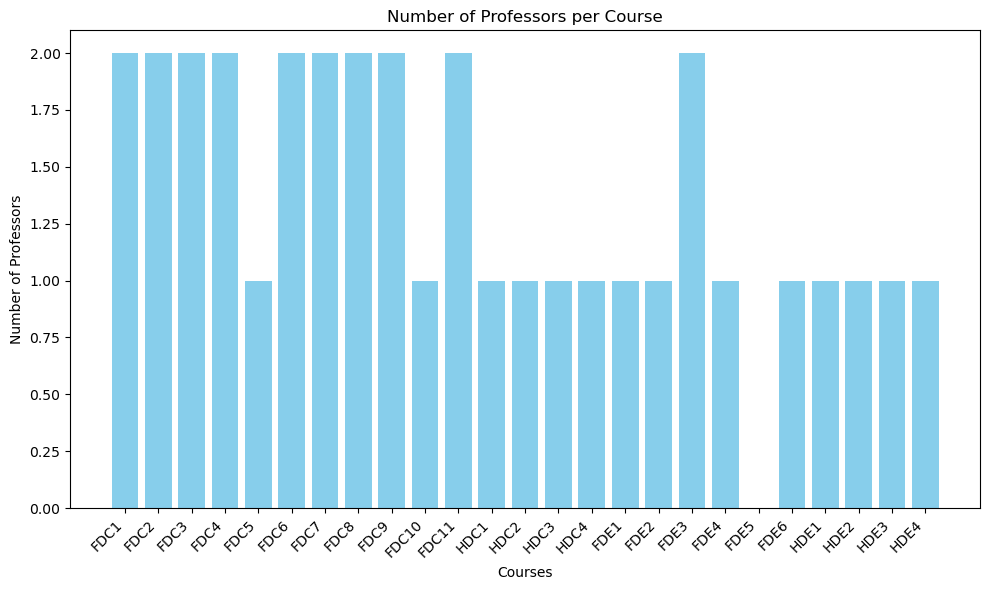

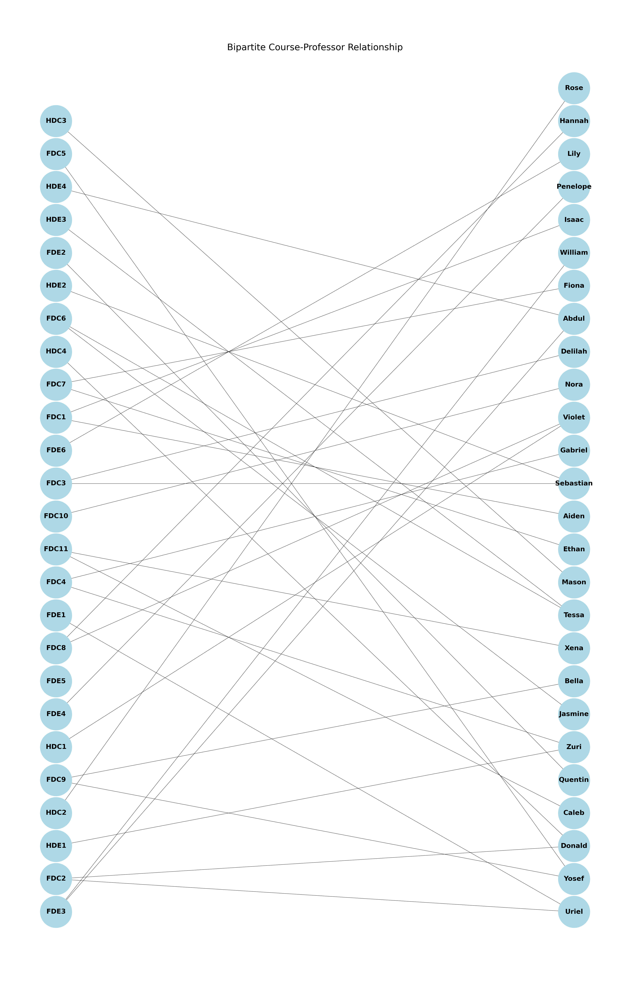

In [2]:
#Reading Datasets
a=int(input("Enter dataset number from 1 to 200: "))
df = pd.read_csv(f"Datasets\Sheet{a}.csv")  

#Changing Categories from X1, X2, X3 to 0.5, 1, 1.5 respectively
df.loc[df['CATEGORY'] == 'X1', 'CATEGORY'] = 0.5
df.loc[df['CATEGORY'] == 'X2', 'CATEGORY'] = 1
df.loc[df['CATEGORY'] == 'X3', 'CATEGORY'] = 1.5

try:
    crashF=1
    crashH=1
    z=0
    while z<5:        
        ndf=df
        #Assigning random ranks to the professors
        random_ranks = np.random.permutation(np.arange(1, ndf.shape[0]+1))
        ndf['Rank'] = random_ranks
        ndf.sort_values('Rank',inplace=True)
        ndf = ndf.reset_index(drop=True)
        #ndf.head(10)
        
        breaking=0
        for prof in range(ndf.shape[0]):
            fc = 0
            hc = 0
            fe = 0
            he=0
            for courses in ndf.iloc[prof].tolist()[3:]:
                if courses.startswith('FDC'):
                    fc+=1
                elif courses.startswith('HDC'):
                    hc += 1
                elif courses.startswith('FDE'):
                    fe += 1
                elif courses.startswith('HDE'):
                    he += 1
            if fc < 4 or hc < 2 or fe < 2 or he <2 :
                print("Crash Case: Preferences of professors are not meeting requirments")
                breaking=1
                break
        if breaking==1:
            break

        #Creating Course Dictionaries  with key-value which denotes course load as 1
        FDC ={'FDC1': 1, 'FDC2': 1, 'FDC3': 1, 'FDC4': 1, 'FDC5': 1, 'FDC6': 1, 'FDC7': 1, 'FDC8': 1, 'FDC9': 1, 'FDC10': 1, 'FDC11': 1}
        HDC={'HDC1': 1, 'HDC2': 1, 'HDC3': 1, 'HDC4': 1}
        FDE = {'FDE1': 1, 'FDE2': 1, 'FDE3': 1, 'FDE4': 1, 'FDE5': 1, 'FDE6': 1}
        HDE = {'HDE1': 1, 'HDE2': 1, 'HDE3': 1, 'HDE4': 1}

        #Checking for any single occurrence of course in the dataset
        test = {**FDC, **HDC}
        only_once=[]
        for key in test:
            occurrences = ndf.values.flatten().tolist().count(key)
            if(occurrences==1):
                only_once.append(key)
        #Creating dictionary out of the given dataset
        proff_dict={}
        for i in range(ndf.shape[0]):
            proff_list=ndf.iloc[i].tolist()
            proff_dict[proff_list[0]]=proff_list[1:]
        #print(proff_dict)

        #Creating a dictionary with courses as key
        allot_dict = {key: [] for key in set(FDC) | set(HDC) | set(FDE) | set(HDE)}
        
        

        #Creating function for assigning course to a professor
        def assign_course(prof_name,course_name):
            for i in allot_dict:
                if i==course_name:
                    allot_dict[i].append(prof_name)    

        #Creating function for cheaking if all argumented courses are completely assigned
        def check_total(x):
            total=0
            for i in x:
                total+=x[i]
            if total==0:
                return True
            else:
                return False        

        #If a course is only occurring once then it is assigned to the professor
        for key in proff_dict:
            for once in only_once:
                if once in proff_dict[key] and proff_dict[key][1] in [1,1.5]:
                    assign_course(key,once)
                    proff_dict[key][1]-=1
                    if once.startswith("FDC"):
                        FDC[once]-=1
                    elif once.startswith("HDC"):
                        HDC[once]-=1

        #Creating the algorithm which decides when to assign the course to the professor
        def preference_priority(x):
            if x==FDC:
                y='FDC'
            elif x==HDC:
                y='HDC'
            elif x==FDE:
                y='FDE'
            elif x==HDE:
                y='HDE'

            for i in range(2,12):
                for name in proff_dict:
                    if proff_dict[name][i].startswith(y):
                        course_name=proff_dict[name][i]
                        if course_name in x:
                            if x[course_name] in [0.5,1] and proff_dict[name][1] in [0.5,1.5]:
                                if proff_dict[name][1] in [0.5,1.5] and course_name not in only_once:
                                    assign_course(name,course_name)
                                    x[course_name]-=0.5
                                    proff_dict[name][1]-=0.5
                                elif proff_dict[name][1]==1.5 and course_name in only_once:
                                    assign_course(name,course_name)
                                    x[course_name]-=1
                                    proff_dict[name][1]-=1
                            elif x[course_name]==1 and proff_dict[name][1] in [1,1.5]:
                                assign_course(name,course_name)
                                x[course_name]=0
                                proff_dict[name][1]-=1

        #Calling above function for all courses
        preference_priority(FDC)
        preference_priority(HDC)
        preference_priority(FDE)
        preference_priority(HDE)
        
        

        # Wrting an algorithm which resets the course load to 1 if left 0.5 and de-assign the professor from the course
        for key in FDC:
            if FDC[key]==0.5:
                FDC[key]+=0.5
                proff=allot_dict[key][0]
                allot_dict[key]=[]
                proff_dict[proff][1]+=0.5
        for key in HDC:
            if HDC[key]==0.5:
                HDC[key]+=0.5
                proff=allot_dict[key][0]
                allot_dict[key]=[]
                proff_dict[proff][1]+=0.5
        for key in FDE:
            if FDE[key]==0.5:
                FDE[key]+=0.5
                proff=allot_dict[key][0]
                allot_dict[key]=[]
                proff_dict[proff][1]+=0.5
        for key in HDE:
            if HDE[key]==0.5:
                HDE[key]+=0.5
                proff=allot_dict[key][0]
                allot_dict[key]=[]
                proff_dict[proff][1]+=0.5
        if check_total(FDC) == True:
            crashF=0
        if check_total(HDC) == True:
            crashH=0
       

        # Finding the required number of professors column
        for i in range(len(allot_dict)):
            if len(list(allot_dict.items())[i][1])>1:
                max=1
                break
            else:
                max=0

        # Creates a dataframe from the allot_dict
        if max==1:
            ndf = pd.DataFrame(allot_dict.items(), columns=['Courses', 'Professors'])
            ndf[['Professor1', 'Professor2']] = pd.DataFrame(ndf['Professors'].tolist(),index=ndf.index)
            ndf = ndf.drop(columns='Professors')
            ndf
            def custom_sort(course):
                letters = course[:3]
                number = int(course[3:])
                category_order = {'FDC': 1, 'HDC': 2, 'FDE': 3, 'HDE': 4}
                return (category_order[letters], number)

            ndf['sort_key'] = ndf['Courses'].apply(custom_sort)
            ndf = ndf.sort_values('sort_key').drop(columns='sort_key')
            ndf = ndf.reset_index(drop=True)
        else:
            ndf = pd.DataFrame(allot_dict.items(), columns=['Courses', 'Professors'])
            ndf['Professor1'] = pd.DataFrame(ndf['Professors'].tolist(),index=ndf.index)
            ndf = ndf.drop(columns='Professors')
            ndf
            def custom_sort(course):
                letters = course[:3]
                number = int(course[3:])
                category_order = {'FDC': 1, 'HDC': 2, 'FDE': 3, 'HDE': 4}
                return (category_order[letters], number)

            ndf['sort_key'] = ndf['Courses'].apply(custom_sort)
            ndf = ndf.sort_values('sort_key').drop(columns='sort_key')
            ndf = ndf.reset_index(drop=True) 

        # Styles the dataframe and downloads output excel file
        def red(x):
            if pd.isna(x):
                return 'font-weight: bold; color: red'
            else:
                return ''

        styled_df = ndf.style.applymap(red)
        styled_df.to_excel(f'Outputs\styled_dataset_{a}_{z+1}.xlsx', index=False)
        print(f"Outfile is downloaded as styled_dataset_{a}_{z+1}")
        display(styled_df)

        # Prepares a bar graph
        if ndf.shape[1]==2:
            professor_counts = ndf[['Professor1']].count(axis=1)
            plt.figure(figsize=(10, 6))
            plt.bar(ndf['Courses'], professor_counts, color='skyblue')
            plt.xlabel('Courses')
            plt.ylabel('Number of Professors')
            plt.title('Number of Professors per Course')
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()
        else:
            professor_counts = ndf[['Professor1', 'Professor2']].count(axis=1)
            plt.figure(figsize=(10, 6))
            plt.bar(ndf['Courses'], professor_counts, color='skyblue')
            plt.xlabel('Courses')
            plt.ylabel('Number of Professors')
            plt.title('Number of Professors per Course')
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()

        # Prepares a bipartite graph

        # Your modified data
        if ndf.shape[1]==2:
            # Use zip_longest to ensure equal length, filling with None
            zipped_data = zip_longest(ndf['Courses'], ndf['Professor1'])

            # Create DataFrame from zipped data
            ndf = pd.DataFrame(zipped_data, columns=['Courses', 'Professor1'])

            # Drop rows where 'Courses' is None
            ndf = ndf.dropna(subset=['Courses'])

            # Continue with the rest of the code for creating and plotting the bipartite graph

            # Create a list of edges (course, professor)
            edges = []
            for _, row in ndf.iterrows():
                course = row['Courses']
                professor1 = row['Professor1']

                if professor1 is not None:
                    edges.append((course, professor1))



            # Create a bipartite graph
            B = nx.Graph()

            # Add nodes with the 'bipartite' attribute
            B.add_nodes_from(ndf['Courses'], bipartite=0)  # Courses
            B.add_nodes_from(ndf['Professor1'].dropna(), bipartite=1)  # Professors

            # Add edges to the bipartite graph
            B.add_edges_from(edges)

            # Separate nodes into two sets for bipartite layout
            courses = {node for node, bipartite in nx.get_node_attributes(B, 'bipartite').items() if bipartite == 0}
            professors = {node for node, bipartite in nx.get_node_attributes(B, 'bipartite').items() if bipartite == 1}

            # Compute bipartite layout
            pos = dict()
            pos.update((node, (1, index)) for index, node in enumerate(courses))
            pos.update((node, (2, index)) for index, node in enumerate(professors))

            # Create a new figure
            fig, ax = plt.subplots(figsize=(50, 80)) 
            # Plot the bipartite graph
            node_size = 20000
            nx.draw(B, pos, with_labels=True, font_size=30, node_size=node_size, node_color='lightblue', font_color='black',font_weight='bold', ax=ax)

            # Add a title to the plot
            ax.set_title("Bipartite Course-Professor Relationship",fontsize=40,y=0.95)
            print()
            print()
            # Display the plot
            plt.show()
        else:
            # Use zip_longest to ensure equal length, filling with None
            zipped_data = zip_longest(ndf['Courses'], ndf['Professor1'], ndf['Professor2'])

            # Create DataFrame from zipped data
            ndf = pd.DataFrame(zipped_data, columns=['Courses', 'Professor1', 'Professor2'])

            # Drop rows where 'Courses' is None
            ndf = ndf.dropna(subset=['Courses'])

            # Continue with the rest of the code for creating and plotting the bipartite graph

            # Create a list of edges (course, professor)
            edges = []
            for _, row in ndf.iterrows():
                course = row['Courses']
                professor1 = row['Professor1']
                professor2 = row['Professor2']

                if professor1 is not None:
                    edges.append((course, professor1))

                if professor2 is not None:
                    edges.append((course, professor2))

            # Create a bipartite graph
            B = nx.Graph()

            # Add nodes with the 'bipartite' attribute
            B.add_nodes_from(ndf['Courses'], bipartite=0)  # Courses
            B.add_nodes_from(ndf['Professor1'].dropna(), bipartite=1)  # Professors
            B.add_nodes_from(ndf['Professor2'].dropna(), bipartite=1)  # Professors

            # Add edges to the bipartite graph
            B.add_edges_from(edges)

            # Separate nodes into two sets for bipartite layout
            courses = {node for node, bipartite in nx.get_node_attributes(B, 'bipartite').items() if bipartite == 0}
            professors = {node for node, bipartite in nx.get_node_attributes(B, 'bipartite').items() if bipartite == 1}

            # Compute bipartite layout
            pos = dict()
            pos.update((node, (1, index)) for index, node in enumerate(courses))
            pos.update((node, (2, index)) for index, node in enumerate(professors))

            # Create a new figure
            fig, ax = plt.subplots(figsize=(50, 80)) 
            # Plot the bipartite graph
            node_size = 20000
            nx.draw(B, pos, with_labels=True, font_size=30, node_size=node_size, node_color='lightblue', font_color='black',font_weight='bold', ax=ax)

            # Add a title to the plot
            ax.set_title("Bipartite Course-Professor Relationship",fontsize=40,y=0.95)
            print()
            print()
            # Display the plot
            plt.show()
        z+=1
    else:
        if crashF==0 and crashH==0:
            print()
        else:
            print("Crash Case: Not all CDCs/HDCs are assigned to professor ")
                
except AttributeError as e:
    if (str(e)=="'float' object has no attribute 'startswith'"):
        print("Crash Case: There is/are null entries in the dataset")

